In [92]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import kaleido

import requests
from urllib.request import urlopen
import json

import math
import haversine as hs

In [93]:
# read in datasets

# dataframe by station, pulled previously from api
stations_df = pd.read_csv('data/Full_Bike_Universe.csv')
stations_df = gpd.GeoDataFrame(stations_df, geometry=gpd.points_from_xy(stations_df.longitude, stations_df.latitude), crs="EPSG:4326") # convert to geo-dataframe for plotting

# datframe by bikeshare networks from api
url = "http://api.citybik.es/v2/networks"
response = urlopen(url)
data_json = json.loads(response.read())
networks_df = pd.json_normalize(data_json['networks'])
networks_df = gpd.GeoDataFrame(networks_df, geometry=gpd.points_from_xy(networks_df['location.longitude'], networks_df['location.latitude']), crs="EPSG:4326") # convert to geo-dataframe for plotting
# df.drop(['source', 'gbfs_href', 'license.name', 'license.url'])

# countries outline shapefile
countries_gdf = gpd.read_file('data/World_Countries_(Generalized).zip')

### Initial Data cleaning

#### Network dataframe
Dataframe contains one row for each bikeshare network from the API

In [94]:
networks_df

,company,href,id,name,location.city,location.country,location.latitude,location.longitude,source,gbfs_href,license.name,license.url,ebikes,geometry
0,[ЗАО «СитиБайк»],/v2/networks/velobike-moscow,velobike-moscow,Velobike,Moscow,RU,55.750000,37.616667,NaN,NaN,NaN,NaN,NaN,POINT (37.61667 55.75000)
1,[Urban Infrastructure Partner],/v2/networks/baerum-bysykkel,baerum-bysykkel,Bysykkel,Bærum,NO,59.894550,10.546343,NaN,NaN,NaN,NaN,NaN,POINT (10.54634 59.89455)
2,[Comunicare S.r.l.],/v2/networks/bicincitta-siena,bicincitta-siena,Bicincittà,Siena,IT,43.318600,11.330600,https://www.bicincitta.com/frmLeStazioni.aspx?...,NaN,NaN,NaN,NaN,POINT (11.33060 43.31860)
3,[Cyclopolis Systems],/v2/networks/cyclopolis-maroussi,cyclopolis-maroussi,Cyclopolis,Maroussi,GR,38.056872,23.808330,NaN,NaN,NaN,NaN,NaN,POINT (23.80833 38.05687)
4,"[Groundwork, Slough Borough Council, ITS]",/v2/networks/cycle-hire-slough,cycle-hire-slough,Cycle Hire,Slough,GB,51.511350,-0.591562,NaN,NaN,NaN,NaN,NaN,POINT (-0.59156 51.51135)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,[PubliBike AG],/v2/networks/publibike-bern,publibike-bern,PubliBike Bern,Bern,CH,46.948410,7.437670,https://api.publibike.ch/v1/static/api.html,NaN,NaN,NaN,NaN,POINT (7.43767 46.94841)
607,[PubliBike AG],/v2/networks/publibike-sottoceneri-ti,publibike-sottoceneri-ti,PubliBike Sottoceneri (TI),Lugano,CH,46.004910,8.952440,https://api.publibike.ch/v1/static/api.html,NaN,NaN,NaN,NaN,POINT (8.95244 46.00491)
608,[PubliBike AG],/v2/networks/publibike-fribourg,publibike-fribourg,PubliBike Fribourg,Fribourg,CH,46.805708,7.160339,https://api.publibike.ch/v1/static/api.html,NaN,NaN,NaN,NaN,POINT (7.16034 46.80571)
609,[PubliBike AG],/v2/networks/publibike-lausanne-morges,publibike-lausanne-morges,PubliBike Lausanne-Morges,Lausanne,CH,46.516649,6.629480,https://api.publibike.ch/v1/static/api.html,NaN,NaN,NaN,NaN,POINT (6.62948 46.51665)


In [95]:
networks_df.href.value_counts() # each href is unique, using to represent the network in calculations

/v2/networks/velobike-moscow                         1
/v2/networks/piaseczynski-rower-miejski-piaseczno    1
/v2/networks/arriva-nitra                            1
/v2/networks/nextbike-marburg                        1
/v2/networks/bubi                                    1
                                                    ..
/v2/networks/adcb-bikeshare                          1
/v2/networks/castellucchio                           1
/v2/networks/velobleu                                1
/v2/networks/notoinbici                              1
/v2/networks/publibike-sion                          1
Name: href, Length: 611, dtype: int64

In [96]:
networks_df.dtypes

company                 object
href                    object
id                      object
name                    object
location.city           object
location.country        object
location.latitude      float64
location.longitude     float64
source                  object
gbfs_href               object
license.name            object
license.url             object
ebikes                  object
geometry              geometry
dtype: object

In [97]:
networks_df.isna().sum()

company                12
href                    0
id                      0
name                    0
location.city           0
location.country        0
location.latitude       0
location.longitude      0
source                455
gbfs_href             507
license.name          584
license.url           584
ebikes                587
geometry                0
dtype: int64

In [98]:
networks_df.company.value_counts()

[Nextbike GmbH]                                            253
[Comunicare S.r.l.]                                        121
[JCDecaux]                                                  23
[BCycle, LLC]                                               21
[Ecovelo]                                                   16
                                                          ... 
[LeVélo AMP Métropole, Ville de Marseille, Fifteen SAS]      1
[Cyacle Bicycle Rental LLC]                                  1
[Municipiul Cluj-Napoca]                                     1
[Prefeiture de Sorocaba, Urbes]                              1
[Keolis, STAP]                                               1
Name: company, Length: 87, dtype: int64

In [99]:
networks_df.name.value_counts()

Nextbike              59
Bicincittà            41
EasyBike              14
VRN                   14
Cyclopolis            11
                      ..
Bicikelj               1
Vélo'V                 1
Prata Camportaccio     1
Vélam                  1
PubliBike Sion         1
Name: name, Length: 413, dtype: int64

In [100]:
# convert company column from list to string
networks_df['company'] = networks_df.company.apply(lambda x: ''.join(x) if x else np.nan)

#convert ebikes column to 1/0 if the network includes ebikes or not
networks_df['ebikes'] = [1 if i == True else 0 for i in networks_df['ebikes']]

#### Station Dataframe

In [101]:
stations_df

,Unnamed: 0,empty_slots,extra,free_bikes,id,latitude,longitude,name,timestamp,href,geometry
0,0,9.0,{'address': 'ст. м. Кропоткинская (выход к Гог...,3,c8a5761ea95e927808b2f37fd65a00f6,55.744901,37.602018,ст. м. Кропоткинская (выход к Гоголевскому бул...,2023-04-25T01:58:40.174000Z,/v2/networks/velobike-moscow,POINT (37.60202 55.74490)
1,1,6.0,"{'address': 'ул. Профсоюзная, д.109, Вс.1 (ст....",6,ac022f0470de9722cc62e06ade73b0a6,55.633750,37.520553,"ул. Профсоюзная, д.109, Вс.1 (ст. м. Коньково,...",2023-04-25T01:58:40.186000Z,/v2/networks/velobike-moscow,POINT (37.52055 55.63375)
2,2,6.0,"{'address': 'ул. Новолесная, д.1/49', 'ebikes'...",9,17ffd07cf6b96ecd32b4980353290399,55.781240,37.592390,"ул. Новолесная, д.1/49",2023-04-25T01:58:40.186000Z,/v2/networks/velobike-moscow,POINT (37.59239 55.78124)
3,3,18.0,"{'address': 'ул. Селезнёвская, д.29, стр.1 (ст...",0,2a711f9eb3228be91abce39eca68e118,55.781785,37.614473,"ул. Селезнёвская, д.29, стр.1 (ст. м. Достоевс...",2023-04-25T01:58:40.193000Z,/v2/networks/velobike-moscow,POINT (37.61447 55.78178)
4,4,6.0,"{'address': 'ул. Новосущёвская, д.22, стр.8', ...",7,70df0b4cae5a2057e8e78cccb4189832,55.789663,37.604464,"ул. Новосущёвская, д.22, стр.8",2023-04-25T01:58:40.194000Z,/v2/networks/velobike-moscow,POINT (37.60446 55.78966)
...,...,...,...,...,...,...,...,...,...,...,...
39018,11,6.0,"{'address': 'Avenue Maurice-Troillet', 'city':...",0,f3bef522afca3599db9220149fb90b43,46.224204,7.333028,Châteauneuf-Furet,2023-04-07T12:19:03.421000Z,/v2/networks/publibike-sion,POINT (7.33303 46.22420)
39019,12,16.0,"{'address': ""Rue de l'Envol 28"", 'city': 'Sion...",0,f9fa0dd9251ec77ed182564b02446833,46.226638,7.342806,P+R Potences,2023-04-07T12:19:03.415000Z,/v2/networks/publibike-sion,POINT (7.34281 46.22664)
39020,13,16.0,"{'address': 'Place du Scex', 'city': 'Sion', '...",0,e63caf6192c3f7c4d406e78c475dac92,46.232201,7.363252,Hors service pour des raisons techniques: Scex,2023-04-07T12:19:03.423000Z,/v2/networks/publibike-sion,POINT (7.36325 46.23220)
39021,14,21.0,"{'address': ""Rue de l'Industrie"", 'city': 'Sio...",0,a1d9ef28817cc12f1ecd71d87aaacf77,46.227072,7.362776,Campus Energypolis,2023-04-07T12:19:03.424000Z,/v2/networks/publibike-sion,POINT (7.36278 46.22707)


In [102]:
stations_df.isna().sum()

Unnamed: 0        0
empty_slots    5016
extra             0
free_bikes        0
id                0
latitude          0
longitude         0
name              1
timestamp         0
href              0
geometry          0
dtype: int64

In [103]:
# convert NaN values to zero in empty slots column
stations_df['empty_slots'] = stations_df['empty_slots'].fillna(0)

# calculate the total docks per station
stations_df['docks'] = stations_df['empty_slots'] + stations_df['free_bikes']
no_docks = stations_df[stations_df['docks'] == 0]
print('Percent of stations with no docks (either closed or not operational):', round(len(no_docks) / len(stations_df),3)*100)
no_docks

Percent of stations with no docks (either closed or not operational): 6.3


,Unnamed: 0,empty_slots,extra,free_bikes,id,latitude,longitude,name,timestamp,href,geometry,docks
819,0,0.0,"{'closed': True, 'slots': 16}",0,2b495ede36cfc0cf52d6ebcb372470a6,38.056872,23.808330,IROON SQUARE,2023-04-25T03:13:23.547000Z,/v2/networks/cyclopolis-maroussi,POINT (23.80833 38.05687),0.0
820,1,0.0,"{'closed': True, 'slots': 14}",0,578e3c46d7dc953a4cf73da64916ca59,38.054038,23.810712,AGHIAS LAVRAS SQUARE,2023-04-25T03:13:23.550000Z,/v2/networks/cyclopolis-maroussi,POINT (23.81071 38.05404),0.0
821,2,0.0,"{'closed': True, 'slots': 24}",0,9cb40305808cfafe5d5436729cc25b2f,38.055782,23.804495,ISAP MAROUSSI,2023-04-25T03:13:23.550000Z,/v2/networks/cyclopolis-maroussi,POINT (23.80449 38.05578),0.0
822,3,0.0,"{'closed': True, 'slots': 16}",0,2ad427571435c598f61ef0f074f46a41,38.044849,23.793412,ISAP NERATZIOTISSA,2023-04-25T03:13:23.551000Z,/v2/networks/cyclopolis-maroussi,POINT (23.79341 38.04485),0.0
823,4,0.0,"{'closed': True, 'slots': 16}",0,bd0ee8cd1628d966eb27da86b606e828,38.047241,23.804985,AGHIOU KONSTANTINOU,2023-04-25T03:13:23.552000Z,/v2/networks/cyclopolis-maroussi,POINT (23.80499 38.04724),0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
37551,7,0.0,"{'bike_uids': [''], 'number': '49045', 'uid': ...",0,05d0d4a53349f176fd00ca8a56a4b767,50.430719,15.811793,Náměstí V. Hanky,2023-04-25T15:24:16.201000Z,/v2/networks/nextbike-dvur-kralove,POINT (15.81179 50.43072),0.0
37585,23,0.0,"{'bike_uids': [''], 'number': '32523', 'slots'...",0,a20e30307356f6f4d502633276ffdca8,47.584342,12.173206,KLARA Zentrum,2023-04-25T15:24:12.341000Z,/v2/networks/vvtregiorad-kufstein,POINT (12.17321 47.58434),0.0
37586,0,0.0,"{'bike_uids': [''], 'number': '32541', 'uid': ...",0,efd1c1be02df70671d59afcb38788930,47.507529,12.293850,Hartkaiserbahn Talstation,2022-11-11T17:02:11.197000Z,/v2/networks/vvtregiorad-ellmau,POINT (12.29385 47.50753),0.0
37827,13,0.0,"{'bike_autonomy': 0, 'bike_state_of_charge': 0...",0,dea06fb6bfd9bd57d07335854c5c3583,48.180763,6.445432,Maison Romaine,2023-04-25T15:24:18.774000Z,/v2/networks/vilvolt,POINT (6.44543 48.18076),0.0


In [104]:
# filtering out stations with no docks
stations_df = stations_df[stations_df['docks'] != 0]
stations_df

,Unnamed: 0,empty_slots,extra,free_bikes,id,latitude,longitude,name,timestamp,href,geometry,docks
0,0,9.0,{'address': 'ст. м. Кропоткинская (выход к Гог...,3,c8a5761ea95e927808b2f37fd65a00f6,55.744901,37.602018,ст. м. Кропоткинская (выход к Гоголевскому бул...,2023-04-25T01:58:40.174000Z,/v2/networks/velobike-moscow,POINT (37.60202 55.74490),12.0
1,1,6.0,"{'address': 'ул. Профсоюзная, д.109, Вс.1 (ст....",6,ac022f0470de9722cc62e06ade73b0a6,55.633750,37.520553,"ул. Профсоюзная, д.109, Вс.1 (ст. м. Коньково,...",2023-04-25T01:58:40.186000Z,/v2/networks/velobike-moscow,POINT (37.52055 55.63375),12.0
2,2,6.0,"{'address': 'ул. Новолесная, д.1/49', 'ebikes'...",9,17ffd07cf6b96ecd32b4980353290399,55.781240,37.592390,"ул. Новолесная, д.1/49",2023-04-25T01:58:40.186000Z,/v2/networks/velobike-moscow,POINT (37.59239 55.78124),15.0
3,3,18.0,"{'address': 'ул. Селезнёвская, д.29, стр.1 (ст...",0,2a711f9eb3228be91abce39eca68e118,55.781785,37.614473,"ул. Селезнёвская, д.29, стр.1 (ст. м. Достоевс...",2023-04-25T01:58:40.193000Z,/v2/networks/velobike-moscow,POINT (37.61447 55.78178),18.0
4,4,6.0,"{'address': 'ул. Новосущёвская, д.22, стр.8', ...",7,70df0b4cae5a2057e8e78cccb4189832,55.789663,37.604464,"ул. Новосущёвская, д.22, стр.8",2023-04-25T01:58:40.194000Z,/v2/networks/velobike-moscow,POINT (37.60446 55.78966),13.0
...,...,...,...,...,...,...,...,...,...,...,...,...
39018,11,6.0,"{'address': 'Avenue Maurice-Troillet', 'city':...",0,f3bef522afca3599db9220149fb90b43,46.224204,7.333028,Châteauneuf-Furet,2023-04-07T12:19:03.421000Z,/v2/networks/publibike-sion,POINT (7.33303 46.22420),6.0
39019,12,16.0,"{'address': ""Rue de l'Envol 28"", 'city': 'Sion...",0,f9fa0dd9251ec77ed182564b02446833,46.226638,7.342806,P+R Potences,2023-04-07T12:19:03.415000Z,/v2/networks/publibike-sion,POINT (7.34281 46.22664),16.0
39020,13,16.0,"{'address': 'Place du Scex', 'city': 'Sion', '...",0,e63caf6192c3f7c4d406e78c475dac92,46.232201,7.363252,Hors service pour des raisons techniques: Scex,2023-04-07T12:19:03.423000Z,/v2/networks/publibike-sion,POINT (7.36325 46.23220),16.0
39021,14,21.0,"{'address': ""Rue de l'Industrie"", 'city': 'Sio...",0,a1d9ef28817cc12f1ecd71d87aaacf77,46.227072,7.362776,Campus Energypolis,2023-04-07T12:19:03.424000Z,/v2/networks/publibike-sion,POINT (7.36278 46.22707),21.0


In [105]:
stations_df['href'].value_counts() # number of stations per network

/v2/networks/nextbike-berlin                 2323
/v2/networks/citi-bike-nyc                   1887
/v2/networks/velib                           1437
/v2/networks/divvy                           1414
/v2/networks/santander-cycles                 794
                                             ... 
/v2/networks/sondrio                            1
/v2/networks/arborbike                          1
/v2/networks/kaliski-rower-miejski-kalisz       1
/v2/networks/alba                               1
/v2/networks/edinburgh-cycle-hire               1
Name: href, Length: 499, dtype: int64

In [106]:
# using href column for network calculations 
network_list = stations_df.href.unique()

#### Operating networks

In [107]:
# update main network df based on network_list that include stations that actually have docks
operating_networks_df = networks_df[networks_df['href'].isin(network_list)]
operating_networks_df

,company,href,id,name,location.city,location.country,location.latitude,location.longitude,source,gbfs_href,license.name,license.url,ebikes,geometry
0,ЗАО «СитиБайк»,/v2/networks/velobike-moscow,velobike-moscow,Velobike,Moscow,RU,55.750000,37.616667,NaN,NaN,NaN,NaN,0,POINT (37.61667 55.75000)
1,Urban Infrastructure Partner,/v2/networks/baerum-bysykkel,baerum-bysykkel,Bysykkel,Bærum,NO,59.894550,10.546343,NaN,NaN,NaN,NaN,0,POINT (10.54634 59.89455)
2,Comunicare S.r.l.,/v2/networks/bicincitta-siena,bicincitta-siena,Bicincittà,Siena,IT,43.318600,11.330600,https://www.bicincitta.com/frmLeStazioni.aspx?...,NaN,NaN,NaN,0,POINT (11.33060 43.31860)
4,GroundworkSlough Borough CouncilITS,/v2/networks/cycle-hire-slough,cycle-hire-slough,Cycle Hire,Slough,GB,51.511350,-0.591562,NaN,NaN,NaN,NaN,0,POINT (-0.59156 51.51135)
7,Cyclopolis Systems,/v2/networks/cyclopolis-aigialeia,cyclopolis-aigialeia,Cyclopolis,Aigialeia,GR,38.251110,22.082157,NaN,NaN,NaN,NaN,0,POINT (22.08216 38.25111)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,PubliBike AG,/v2/networks/publibike-bern,publibike-bern,PubliBike Bern,Bern,CH,46.948410,7.437670,https://api.publibike.ch/v1/static/api.html,NaN,NaN,NaN,0,POINT (7.43767 46.94841)
607,PubliBike AG,/v2/networks/publibike-sottoceneri-ti,publibike-sottoceneri-ti,PubliBike Sottoceneri (TI),Lugano,CH,46.004910,8.952440,https://api.publibike.ch/v1/static/api.html,NaN,NaN,NaN,0,POINT (8.95244 46.00491)
608,PubliBike AG,/v2/networks/publibike-fribourg,publibike-fribourg,PubliBike Fribourg,Fribourg,CH,46.805708,7.160339,https://api.publibike.ch/v1/static/api.html,NaN,NaN,NaN,0,POINT (7.16034 46.80571)
609,PubliBike AG,/v2/networks/publibike-lausanne-morges,publibike-lausanne-morges,PubliBike Lausanne-Morges,Lausanne,CH,46.516649,6.629480,https://api.publibike.ch/v1/static/api.html,NaN,NaN,NaN,0,POINT (6.62948 46.51665)


### Calculations & feature creation

In [108]:
# calculate number of stations and bikes per network

stations = stations_df.groupby(by='href').count().reset_index()[['href', 'name']]
stations = stations.rename(columns={'name':'stations'})
docks = stations_df.groupby(by='href').sum().reset_index()[['href', 'docks']]

# subset operating network dataframe with location data and merge with station & bike count details
operating_networks_df = operating_networks_df[['company', 'href', 'name', 'location.city', 'location.country', 'location.latitude', 'location.longitude', 'geometry', 'ebikes']]
operating_networks_df = operating_networks_df.merge(stations)
operating_networks_df = operating_networks_df.merge(docks)
operating_networks_df

,company,href,name,location.city,location.country,location.latitude,location.longitude,geometry,ebikes,stations,docks
0,ЗАО «СитиБайк»,/v2/networks/velobike-moscow,Velobike,Moscow,RU,55.750000,37.616667,POINT (37.61667 55.75000),0,786,12821.0
1,Urban Infrastructure Partner,/v2/networks/baerum-bysykkel,Bysykkel,Bærum,NO,59.894550,10.546343,POINT (10.54634 59.89455),0,13,216.0
2,Comunicare S.r.l.,/v2/networks/bicincitta-siena,Bicincittà,Siena,IT,43.318600,11.330600,POINT (11.33060 43.31860),0,19,191.0
3,GroundworkSlough Borough CouncilITS,/v2/networks/cycle-hire-slough,Cycle Hire,Slough,GB,51.511350,-0.591562,POINT (-0.59156 51.51135),0,17,478.0
4,Cyclopolis Systems,/v2/networks/cyclopolis-aigialeia,Cyclopolis,Aigialeia,GR,38.251110,22.082157,POINT (22.08216 38.25111),0,3,48.0
...,...,...,...,...,...,...,...,...,...,...,...
494,PubliBike AG,/v2/networks/publibike-bern,PubliBike Bern,Bern,CH,46.948410,7.437670,POINT (7.43767 46.94841),0,230,7149.0
495,PubliBike AG,/v2/networks/publibike-sottoceneri-ti,PubliBike Sottoceneri (TI),Lugano,CH,46.004910,8.952440,POINT (8.95244 46.00491),0,116,5065.0
496,PubliBike AG,/v2/networks/publibike-fribourg,PubliBike Fribourg,Fribourg,CH,46.805708,7.160339,POINT (7.16034 46.80571),0,55,1515.0
497,PubliBike AG,/v2/networks/publibike-lausanne-morges,PubliBike Lausanne-Morges,Lausanne,CH,46.516649,6.629480,POINT (6.62948 46.51665),0,66,1388.0


In [109]:
# calculate the haversine distance between a set of coordinates
def distance_calculation(i,j):
    return hs.haversine(i,j)

# calculate the average distance to the next closest station within a bikeshare network
def closest_station_distance(network):
    single_network = stations_df[stations_df['href'] == network].reset_index(drop='index')
    
    # if there is only one station in the network, closest distance is 0
    if len(single_network) == 1:
        return 0 
    
    # otherwise, calculate the closest distance
    else: 
        # create coordinate from lat long
        single_network['coordinate'] = list(zip(single_network.latitude, single_network.longitude))

        # create empty dataframe for matrix of distance calculation between each station
        distance_matrix = pd.DataFrame()

        # iterate through each row in dataframe and calculate the haversine distnace between that row and other rows
        for _, row in single_network.iterrows():
            distance_matrix[row.coordinate] = single_network['coordinate'].apply(lambda x: distance_calculation(row.coordinate, x))

        # create list for the closest distance to each station
        closest_dist_list = []

        # iterate through each row (station) and sort the values by the smallest distance. take the second smallest number (first smallest will be 0, the disance to itself)
        for _, row in distance_matrix.iterrows():
            closest_dist = row.sort_values(ascending=True).iloc[1]
            closest_dist_list.append(closest_dist)

        average_closest_dist = sum(closest_dist_list)/len(closest_dist_list)

        return average_closest_dist


In [110]:
# calculate average distance to next closest station for each network and append to dataframe
distance_list = [closest_station_distance(i) for i in network_list]
station_distance_df = pd.DataFrame({'href': network_list, 'distance': distance_list})
station_distance_df

C:\Users\abonc\AppData\Local\Temp\ipykernel_35900\1694345486.py:23: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\abonc\AppData\Local\Temp\ipykernel_35900\1694345486.py:23: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\abonc\AppData\Local\Temp\ipykernel_35900\1694345486.py:23: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragment

,href,distance
0,/v2/networks/velobike-moscow,9.391865
1,/v2/networks/baerum-bysykkel,0.250965
2,/v2/networks/bicincitta-siena,0.610223
3,/v2/networks/cycle-hire-slough,0.757784
4,/v2/networks/cyclopolis-aigialeia,0.413637
...,...,...
494,/v2/networks/publibike-bern,0.272971
495,/v2/networks/publibike-sottoceneri-ti,0.636604
496,/v2/networks/publibike-fribourg,0.399559
497,/v2/networks/publibike-lausanne-morges,0.551532


In [111]:
# combine distance calculation with operating network dataframe
combined_network_df = operating_networks_df.merge(station_distance_df)

# calculate average number of docks per statation for each network
combined_network_df['docks per station'] = combined_network_df['docks'] / combined_network_df['stations']

combined_network_df

,company,href,name,location.city,location.country,location.latitude,location.longitude,geometry,ebikes,stations,docks,distance,docks per station
0,ЗАО «СитиБайк»,/v2/networks/velobike-moscow,Velobike,Moscow,RU,55.750000,37.616667,POINT (37.61667 55.75000),0,786,12821.0,9.391865,16.311705
1,Urban Infrastructure Partner,/v2/networks/baerum-bysykkel,Bysykkel,Bærum,NO,59.894550,10.546343,POINT (10.54634 59.89455),0,13,216.0,0.250965,16.615385
2,Comunicare S.r.l.,/v2/networks/bicincitta-siena,Bicincittà,Siena,IT,43.318600,11.330600,POINT (11.33060 43.31860),0,19,191.0,0.610223,10.052632
3,GroundworkSlough Borough CouncilITS,/v2/networks/cycle-hire-slough,Cycle Hire,Slough,GB,51.511350,-0.591562,POINT (-0.59156 51.51135),0,17,478.0,0.757784,28.117647
4,Cyclopolis Systems,/v2/networks/cyclopolis-aigialeia,Cyclopolis,Aigialeia,GR,38.251110,22.082157,POINT (22.08216 38.25111),0,3,48.0,0.413637,16.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,PubliBike AG,/v2/networks/publibike-bern,PubliBike Bern,Bern,CH,46.948410,7.437670,POINT (7.43767 46.94841),0,230,7149.0,0.272971,31.082609
495,PubliBike AG,/v2/networks/publibike-sottoceneri-ti,PubliBike Sottoceneri (TI),Lugano,CH,46.004910,8.952440,POINT (8.95244 46.00491),0,116,5065.0,0.636604,43.663793
496,PubliBike AG,/v2/networks/publibike-fribourg,PubliBike Fribourg,Fribourg,CH,46.805708,7.160339,POINT (7.16034 46.80571),0,55,1515.0,0.399559,27.545455
497,PubliBike AG,/v2/networks/publibike-lausanne-morges,PubliBike Lausanne-Morges,Lausanne,CH,46.516649,6.629480,POINT (6.62948 46.51665),0,66,1388.0,0.551532,21.030303


In [112]:
combined_network_df.sort_values(by='distance', ascending=False)

,company,href,name,location.city,location.country,location.latitude,location.longitude,geometry,ebikes,stations,docks,distance,docks per station
79,Comunicare S.r.l.,/v2/networks/terni,Terni,Terni,IT,42.563617,12.642660,POINT (12.64266 42.56362),0,15,137.0,162.772448,9.133333
418,Nextbike GmbH,/v2/networks/lovesharing-canary-islands-lanzarote,Lovesharing (Canary Islands),Lanzarote,ES,29.049100,-13.572900,POINT (-13.57290 29.04910),0,2,9.0,34.700366,4.500000
103,Comunicare S.r.l.,/v2/networks/venezia,Venezia,Venezia,IT,45.440847,12.315515,POINT (12.31552 45.44085),0,2,16.0,13.379846,8.000000
195,Mobilicidade Tecnologia LTDGrupo Serttel LTDA,/v2/networks/bikesantos,BikeSantos,Santos,BR,-23.954052,-46.333345,POINT (-46.33335 -23.95405),0,37,496.0,12.926641,13.405405
192,Mobilicidade Tecnologia LTDGrupo Serttel LTDA,/v2/networks/bicicletar,Bicicletar,Fortaleza,BR,-3.732194,-38.510347,POINT (-38.51035 -3.73219),0,204,2944.0,11.962403,14.431373
...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,Comunicare S.r.l.,/v2/networks/rimini,Mi Muovo in Bici,Rimini,IT,44.057082,12.564600,POINT (12.56460 44.05708),0,1,7.0,0.000000,7.000000
152,Comunicare S.r.l.,/v2/networks/bianzone-in-bici,Bianzone in Bici,Bianzone,IT,46.188197,10.109354,POINT (10.10935 46.18820),0,1,4.0,0.000000,4.000000
46,Comunicare S.r.l.,/v2/networks/novara,Novara,Novara,IT,45.445740,8.622165,POINT (8.62217 45.44574),0,1,6.0,0.000000,6.000000
470,Nextbike GmbH,/v2/networks/arval-scandicci,ARVAL,Scandicci,IT,43.770100,11.159200,POINT (11.15920 43.77010),0,1,5.0,0.000000,5.000000


In [113]:
# drop territory
countries_gdf = countries_gdf[countries_gdf.COUNTRY != 'Canarias']

### EDA

AttributeError: 'GeoDataFrame' object has no attribute 'set_title'

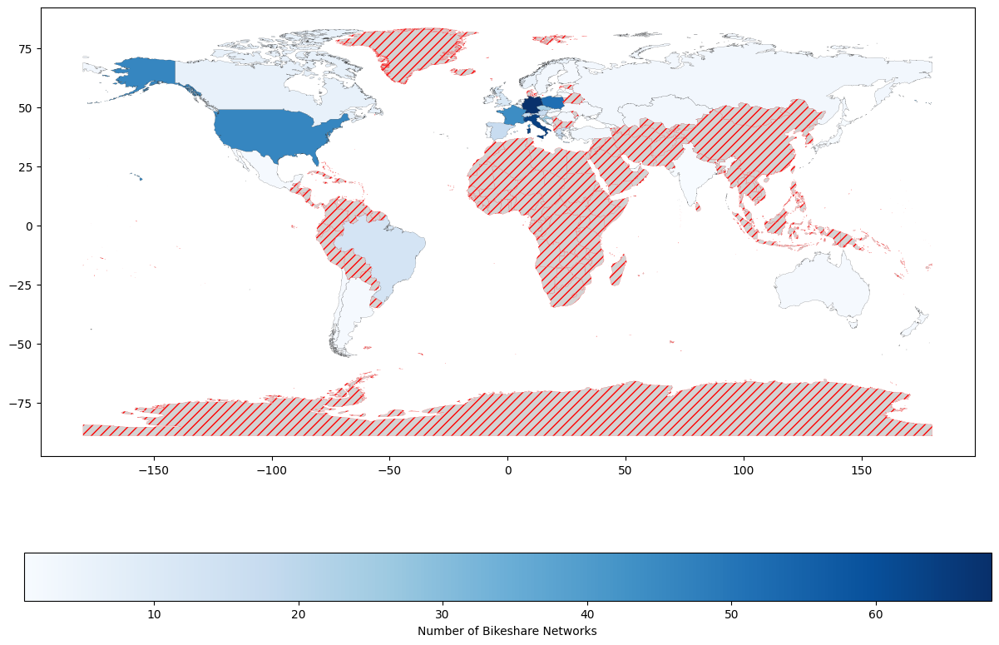

In [114]:
# plot the number of bikeshare networks for each country

# sum the number of bikeshare networks by country
networks_byCountry = operating_networks_df['location.country'].value_counts().rename_axis('ISO').reset_index(name='networks')
networks_byCountry

# add to shapefile
countries_gdf = countries_gdf.merge(networks_byCountry, on='ISO', how='left')
countries_gdf
countries_gdf.plot(column='networks', figsize=(15, 10),
                     legend=True, legend_kwds={"label": "Number of Bikeshare Networks", "orientation": "horizontal"},
                     missing_kwds={"color": "lightgrey", "edgecolor": "red","hatch": "///","label": "Missing values",},
                     cmap='Blues', linewidth=0.1, edgecolor='black')

countries_gdf.set_title('Number of Bikeshare networks by Country')

file = 'images/networksbyCountry.jpg'
countries_gdf.figure.savefig(file)

In [ ]:
# countries with the most bikeshare networks

countries_gdf.sort_values(by='networks', ascending=False)


,FID,COUNTRY,ISO,COUNTRYAFF,AFF_ISO,SHAPE_Leng,SHAPE_Area,geometry,networks
84,86,Germany,DE,Germany,DE,56.115038,45.872054,"MULTIPOLYGON (((7.69722 47.54333, 7.65611 47.5...",68.0
110,112,Italy,IT,Italy,IT,68.044301,33.055064,"MULTIPOLYGON (((12.75357 43.97100, 12.76472 43...",64.0
177,179,Poland,PL,Poland,PL,35.327836,40.910731,"POLYGON ((22.68606 49.57709, 22.67846 49.56944...",52.0
237,239,United States,US,United States,US,726.106056,1116.670604,"MULTIPOLYGON (((-76.39501 39.22999, -76.38695 ...",46.0
77,79,France,FR,France,FR,65.847043,64.348325,"MULTIPOLYGON (((1.78172 42.56996, 1.73861 42.6...",44.0
...,...,...,...,...,...,...,...,...,...
245,247,Vietnam,VN,Viet Nam,VN,66.866802,27.556082,"MULTIPOLYGON (((107.07896 17.10804, 107.08333 ...",NaN
246,248,Wallis and Futuna,WF,France,FR,0.700608,0.013414,"MULTIPOLYGON (((-178.06082 -14.32389, -178.137...",NaN
247,249,Yemen,YE,Yemen,YE,34.011327,38.289871,"MULTIPOLYGON (((47.25445 13.61528, 47.16888 13...",NaN
248,250,Zambia,ZM,Zambia,ZM,49.141439,62.814022,"POLYGON ((30.21302 -14.98172, 30.21916 -15.096...",NaN


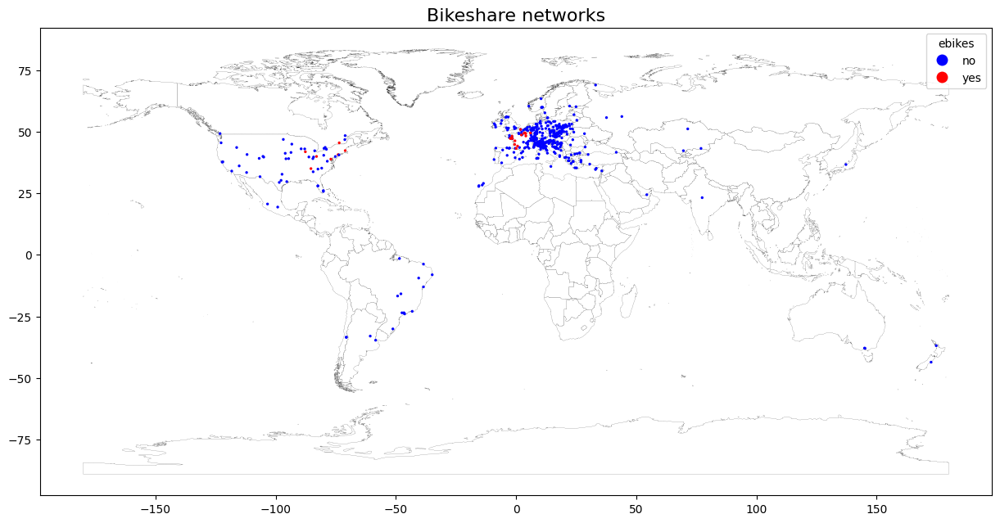

In [131]:
# plot each bikeshare network (red if they have ebikes, blue if not)
colors = ['red' if i == True else 'blue' for i in operating_networks_df['ebikes']]

temp_network = operating_networks_df.copy()
temp_network['ebikes'] = temp_network['ebikes'].map({1:'yes', 0:'no'})
base = countries_gdf.plot(color='white', linewidth=0.1, edgecolor='black', figsize=(15, 10))

temp_network.plot(ax=base, column='ebikes',categorical=True, markersize=2, legend=True, cmap='bwr')
base.set_title('Bikeshare networks', fontsize=16)
base.get_legend().set_title(title='ebikes')
plt.show()

base.figure.savefig('images/bikeshareNetworks.jpg')

Bikeshare companies

In [ ]:
# for each bikeshare company, how many networks do they operate and in which cities and countries?

# get each unique bikeshare company
companies_df = operating_networks_df.groupby(by='company').name.unique().reset_index()
companies_df['Network Count'] = companies_df['name'].apply(lambda x: len(x))

# get cities of operations for every company
cities = operating_networks_df.groupby(by='company')['location.city'].unique().reset_index()
cities['City Count'] = cities['location.city'].apply(lambda x: len(x))

# get countries of operations for every company
countries = operating_networks_df.groupby(by='company')['location.country'].unique().reset_index()
countries['Country Count'] = countries['location.country'].apply(lambda x: len(x))

companies_df = companies_df.merge(cities)
companies_df = companies_df.merge(countries)
companies_df

,company,name,Network Count,location.city,City Count,location.country,Country Count
0,"BCycle, LLC","[Austin B-cycle, Boulder B-cycle, Broward B-cy...",19,"[Austin, TX, Boulder, CO, Fort Lauderdale, FL,...",20,[US],1
1,BKT bici publica S.A. de C.V.PBSC Urban Solutions,[MIBICI],1,[Guadalajara],1,[MX],1
2,Baksi Bike Sharing System,[Baksi],1,"[Antalya, Izmir, Kocaeli]",3,[TR],1
3,"Barcelona de Serveis Municipals, S.A. (BSM)CES...",[Bicing],1,[Barcelona],1,[ES],1
4,"Bcycle, LLCRTC Southern Nevada, Inc",[RTC Bike Share],1,"[Las Vegas, NV]",1,[US],1
...,...,...,...,...,...,...,...
71,"Velobike.kz, LLPSmoove","[Velobike, Almatybike, Shymkentbike]",3,"[Astana, Almaty, Shymkent]",3,[KZ],1
72,Veolia,"[Vélo Bleu, Vél'in]",2,"[Nice, Calais]",2,[FR],1
73,Vilvolt CA ÉpinalCommunauté d'agglomération Ép...,[Vilvolt],1,[Epinal],1,[FR],1
74,Your BikeUrban Sharing,[Just Eat Cycles],1,[Edinburgh],1,[UK],1


In [ ]:
# plot distribution of number of networks each company operates
fig = px.histogram(companies_df, x='Network Count', nbins=200, marginal='box',
                   title='Distribution of number of networks a Bikeshare company operates')
fig.show()
fig.write_image('images/companiesNetworks.png', width=1000, height=400)

In [ ]:
# plot distribution of number of cities each company operates in
fig = px.histogram(companies_df, x='City Count', nbins=200, marginal='box',
                   title='Distribution of number of cities a Bikeshare company operates in')
fig.show()
fig.write_image('images/companiesCities.png', width=1000, height=400)

In [ ]:
companies_df.sort_values(by='Network Count', ascending=False)

,company,name,Network Count,location.city,City Count,location.country,Country Count
44,Nextbike GmbH,"[Nextbike, VISA, KVB Rad, Fächerrad, Burgenlan...",134,"[Leipzig, Wiesbaden, Frankfurt, Köln, Karlsruh...",234,"[DE, AT, CH, LV, PL, CY, NZ, HR, GB, US, UA, M...",24
14,Comunicare S.r.l.,"[Bicincittà, Tigullionbike, ARbike, Alba, Biel...",43,"[Siena, Mantova, Assemini, Montecatini Terme, ...",61,"[IT, ME]",2
28,JCDecaux,"[cy'clic, Vélô, Veloh, Valenbisi, Lundahoj, Tu...",22,"[Rouen, Toulouse, Luxembourg, Valencia, Lund, ...",23,"[FR, LU, ES, SE, NO, SI, BE, LT, JP, IE]",10
0,"BCycle, LLC","[Austin B-cycle, Boulder B-cycle, Broward B-cy...",19,"[Austin, TX, Boulder, CO, Fort Lauderdale, FL,...",20,[US],1
23,Ecovelo,"[Tarbes et Lourdes vls, ZébullO, Velect’in, Ru...",16,"[Tarbes, Lourdes, Reims, Calais, Bourg-en-Bres...",16,[FR],1
...,...,...,...,...,...,...,...
1,BKT bici publica S.A. de C.V.PBSC Urban Solutions,[MIBICI],1,[Guadalajara],1,[MX],1
39,"Motivate International, Inc.PBSC Urban Solutio...",[Bixi],1,"[Montréal, QC]",1,[CA],1
40,"Motivate International, IncPBSC",[Bike Chattanooga],1,"[Chattanooga, TN]",1,[US],1
41,Motivate LLC,[Bay Wheels],1,"[San Francisco Bay Area, CA]",1,[US],1


In [ ]:
# how many networks operate in each city?

cities_df = operating_networks_df.groupby(by='location.city').name.unique().reset_index()
cities_df['Network Count'] = cities_df['name'].apply(lambda x: len(x))
cities_df.sort_values(by='Network Count', ascending=False)

,location.city,name,Network Count
463,Warszawa,"[VETURILO, Stacje Sponsorskie Nextbike Veturilo]",2
71,Calais,"[Vél'in, Velect’in]",2
417,São Paulo,"[CicloSampa, BikeSampa]",2
226,Ljubljana,"[Bicikelj, Nomago Bikes - LJUBLJANA]",2
339,Poznań,"[PRM, Stacje Sponsorskie Nextbike PRM]",2
...,...,...,...
160,"Houston, TX",[Houston B-cycle],1
159,Horw,[Nextbike],1
158,Hollabrunn,[Nextbike],1
157,Hockenheim,[VRN],1


Bikeshare networks

<AxesSubplot:>

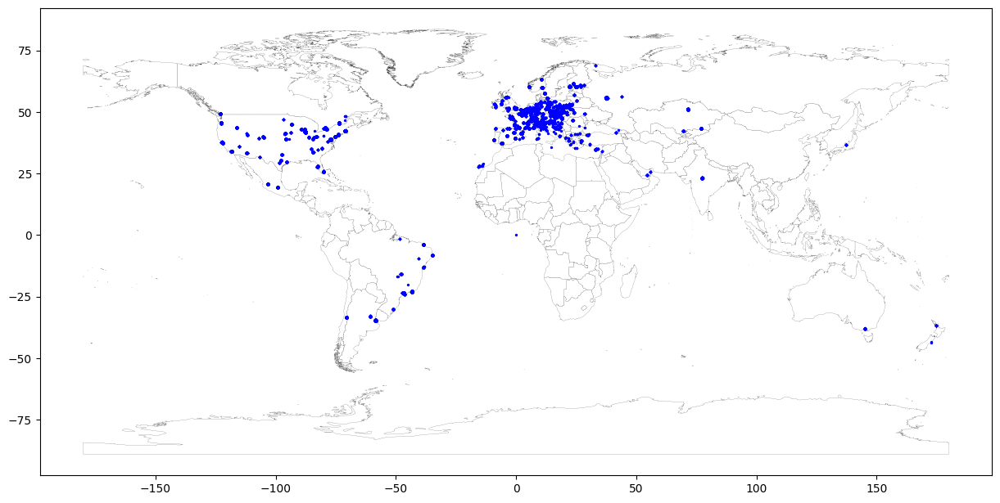

In [ ]:
# plot each bikeshare station (similar to the network plot, since stations are very close to each other and centered around the network lat/long)
base = countries_gdf.plot(color='white', linewidth=0.1, edgecolor='black', figsize=(15, 10))
stations_df.plot(ax=base, color='blue', markersize=2)


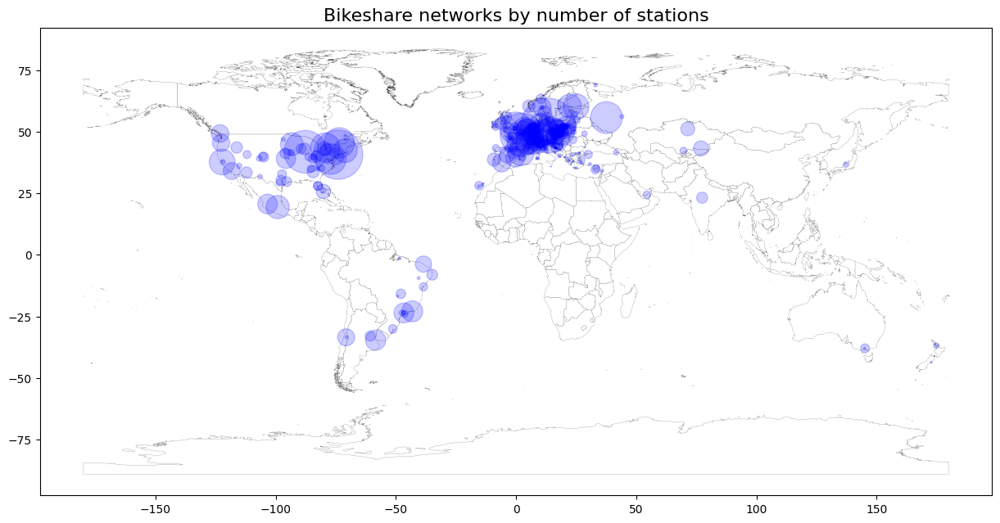

In [ ]:
# plot each bikeshare network by number of stations
base = countries_gdf.plot(color='white', linewidth=0.1, edgecolor='black', figsize=(15, 10))
operating_networks_df.plot(ax=base, color='blue', markersize=operating_networks_df['stations'], alpha=0.2)
base.set_title('Bikeshare networks by number of stations', fontsize=16)
plt.show()
base.figure.savefig('images/bikeshareNetworksbyStations.jpg')


In [ ]:
# plot distribution of number of docks by network
fig = px.histogram(combined_network_df, x='docks', nbins=200, marginal='box',
                   title='Distribution of number of bike docks by Bikeshare network')
fig.show()
fig.write_image('images/docks_by_network.png', width=1000, height=400)

In [ ]:
# plot distribution of number of stations by network
fig = px.histogram(combined_network_df, x='stations', nbins=200, marginal='box',
                   title='Distribution of number of stations by Bikeshare network')
fig.show()

fig.write_image('images/stations_by_network.png', width=1000, height=400)

In [ ]:
# plot distribution of average distane to closest station in network
# drop networks that only have one station
temp_network = combined_network_df[combined_network_df['distance'] != 0]
fig = px.histogram(temp_network, x='distance', nbins=200, marginal='box',
                   title='Average distance (km) to the closest station by Bikeshare network')
fig.show()
fig.write_image('images/distance.png', width=1000, height=400)


In [ ]:
fig = px.scatter(combined_network_df, x='distance',y='stations',
                 title='Average distance (km) to closest station by Number of stations by Bikeshare network')
fig.show()
fig.write_image('images/stations_by_distance.png', width=1000, height=400)


In [ ]:
fig = px.scatter(combined_network_df, x='docks',y='stations',
                 title ='Number of bike docks by Number of stations by Bikeshare network')
fig.show()
fig.write_image('images/stations_by_docks.png', width=1000, height=400)


In [ ]:
corr_matrix = combined_network_df[['ebikes', 'stations', 'docks', 'distance', 'docks per station']].corr()
corr_matrix

fig = px.imshow(corr_matrix, text_auto=True, width=800, height=700,
                title='Correlation matrix for Bikeshare features')
fig.show()
fig.write_image('images/corr.png', width=1000, height=400)


Text(0.5, 1.0, 'Bikeshare networks by number of bike docks')

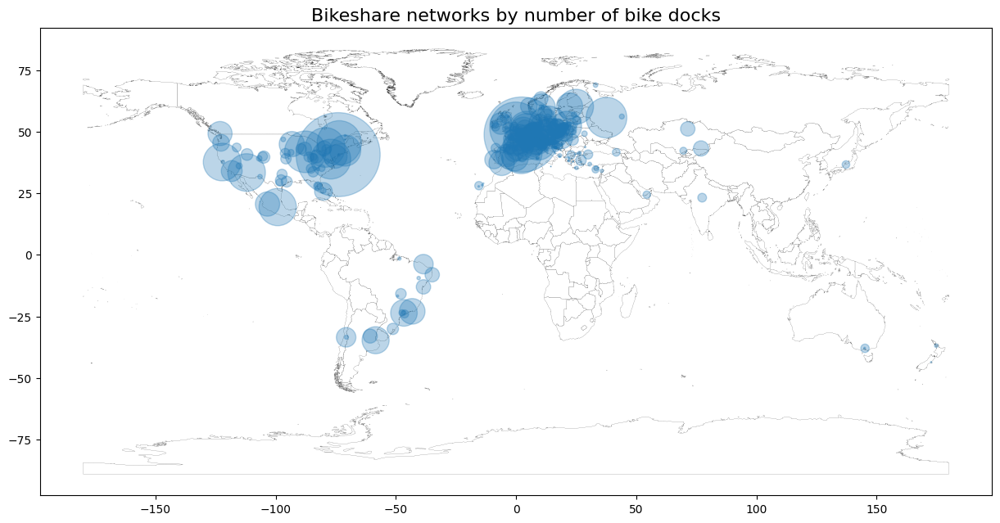

In [ ]:
# plot each bikeshare network by number of dock
markersize = combined_network_df['docks'] / 10

base = countries_gdf.plot(color='white', linewidth=0.1, edgecolor='black', figsize=(15, 10))
combined_network_df.plot(ax=base, markersize=markersize, alpha=0.3)
base.set_title('Bikeshare networks by number of bike docks', fontsize=16)
base.figure.savefig('images/bikeshareNetworksbyDocks.jpg')

c:\Users\abonc\AppData\Local\Programs\Python\Python310\lib\site-packages\matplotlib\collections.py:1099: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.



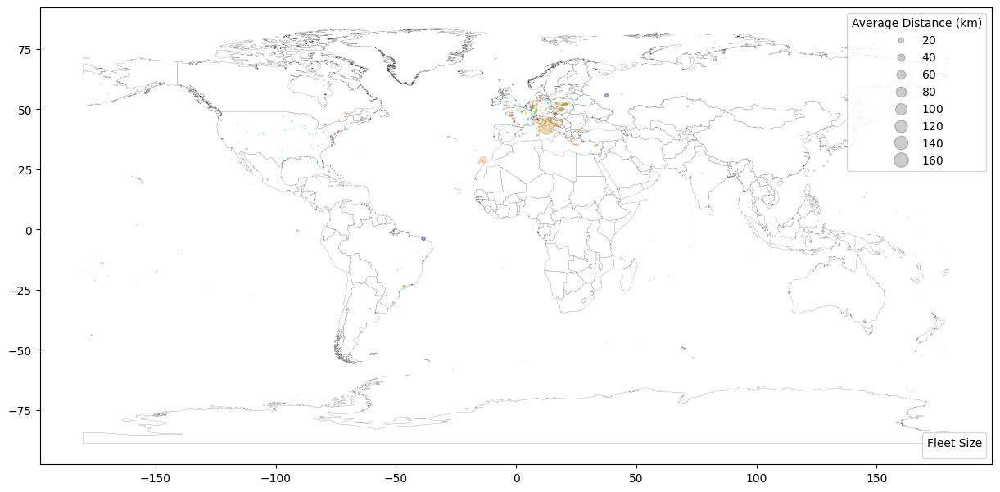

In [ ]:
# plot each bikeshare dock
markersize = combined_network_df['distance'] 
combined_network_df['color'] = ['darkblue' if i > 1500 
          else 'cornflowerblue' if i > 1000 
          else 'cyan' if i > 500
          else 'lightgreen' if i > 250 
          else 'darkgoldenrod' if i > 100
          else 'sandybrown' for i in combined_network_df['docks']]

fig, ax = plt.subplots(figsize=(15, 10))

# color_dict = {'1500+':'darkblue', '1000-1500': 'cornflowerblue', '500-1000':'cyan','250-500':'lightgreen', '100-250':'darkgoldenrod', '<100':'sandybrown'}

countries_gdf.plot(ax=ax, color='white', linewidth=0.1, edgecolor='black')
# combined_network_df.plot(ax=ax, color=combined_network_df['color'], markersize=markersize, alpha=0.3, 
#                          legend=True, label='Average Closest Station Distance')


scatter = ax.scatter(combined_network_df['location.longitude'], combined_network_df['location.latitude'], c=combined_network_df['color'], s=markersize, alpha=.3)

# produce a legend with the unique colors from the scatter
handles, labels = scatter.legend_elements(prop='colors', alpha=0.2)
# legend1 = ax.legend(*scatter.legend_elements(prop="colors"),
#                     loc="lower right", title="Fleet Size")
legend1 = ax.legend(handles, labels,
                    loc="lower right", title="Fleet Size")
ax.add_artist(legend1)

# produce a legend with a cross-section of sizes from the scatter
handles, labels = scatter.legend_elements(prop='sizes', alpha=0.2)
legend2 = ax.legend(handles, labels, loc="upper right", title="Average Distance (km)")

plt.show()

### EDA for single country

In [118]:
# functions for EDA for a country
import os
if not os.path.exists("images"):
    os.mkdir("images")

#  plot distribution of feature across networks in a country
def plot_hist(country_name, df, hist_data):
    fig = px.histogram(df, x=hist_data, nbins=200, marginal='box', title=f'Histgram of number of {hist_data} by Bikeshare network in {country_name}')
    fig.show()
    file = 'images/' + country_name+'_hist.png'
    fig.write_image(file, width=1000, height=400)

#  plot distribution of two features across networks in a country
def plot_scatter(country_name, df, x_data, y_data):
    fig = px.scatter(df, x=x_data, y=y_data, title=f'Plot of {x_data} vs {y_data} by Bikeshare networks in {country_name}')
    fig.show()
    file = 'images/' + country_name+'_scatter.png'
    fig.write_image(file, width=1000, height=400)

# compute correlation matrix for country based on list of features
def plot_corr(country_name, df, corr_list):
    corr_matrix = df[corr_list].corr()
    fig = px.imshow(corr_matrix, text_auto=True, title=f'Correlation matrix for {country_name}')
    fig.show()
    file = 'images/' + country_name+'_corr.png'
    fig.write_image(file, width=800, height=700)

# plot each bikeshare network in a country with marker size based on feature of choice
def plot_geo(country_name, gdf, df, feature, scale):

    markersize = df[feature] * scale

    base = gdf.plot(color='white', linewidth=0.5, edgecolor='black', figsize=(15, 10))
    df.plot(ax=base, color='blue', markersize=markersize, alpha=0.2)

    base.set_axis_off()
    base.set_title(f'Number of {feature} per Bikeshare network in {country_name}')

    file = 'images/'+country_name+'_plot.jpg'
    base.figure.savefig(file)


In [119]:
# input data - function to make plots for one country
def plots_country(country_name):

    # create gdf and df from user supplied country input
    country_ISO = countries_gdf[countries_gdf['COUNTRY'] == country_name]['ISO'].sum()
    country_gdf = countries_gdf[countries_gdf['ISO'] == country_ISO]
    country_network_df = combined_network_df[combined_network_df['location.country'] == country_ISO]
    # print(country_network_df.head())

    feature='stations'
    scale = 10
    hist_data = 'docks'
    x_data = 'distance'
    y_data = 'stations'

    if country_network_df['ebikes'].sum() == 0:
        corr_list = ['stations', 'docks', 'distance', 'docks per station']
    else:
        corr_list = ['ebikes', 'stations', 'docks', 'distance', 'docks per station']    

    # call functions based on input data
    plot_hist(country_name, country_network_df, hist_data)
    plot_scatter(country_name, country_network_df, x_data, y_data)
    plot_geo(country_name, country_gdf, country_network_df, feature, scale)
    plot_corr(country_name, country_network_df, corr_list)

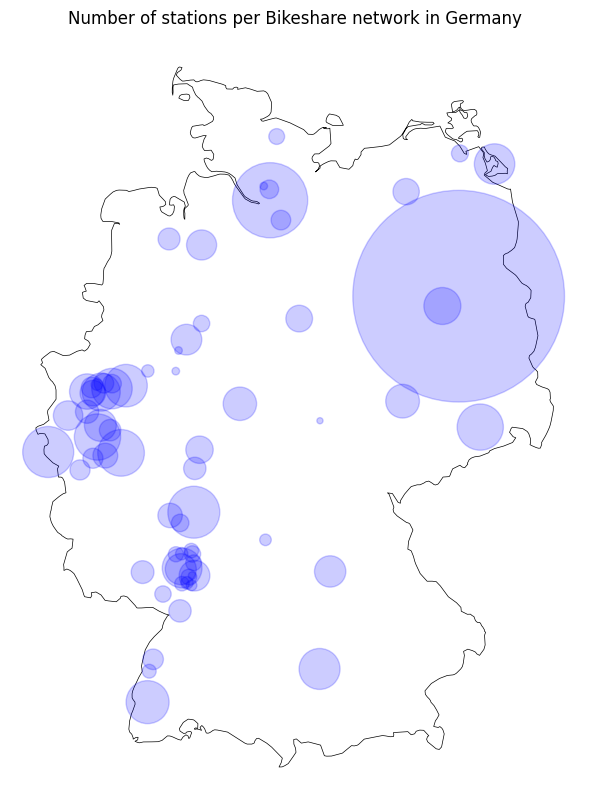

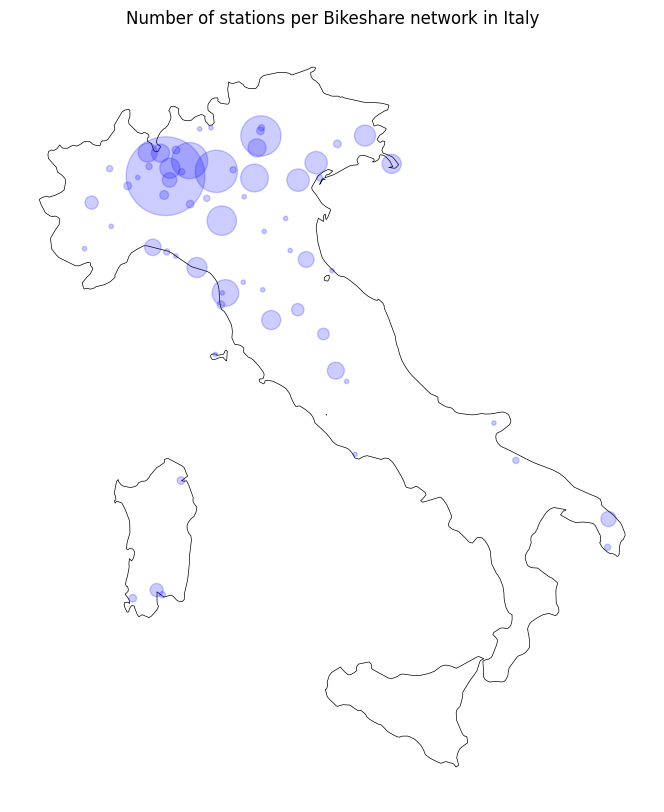

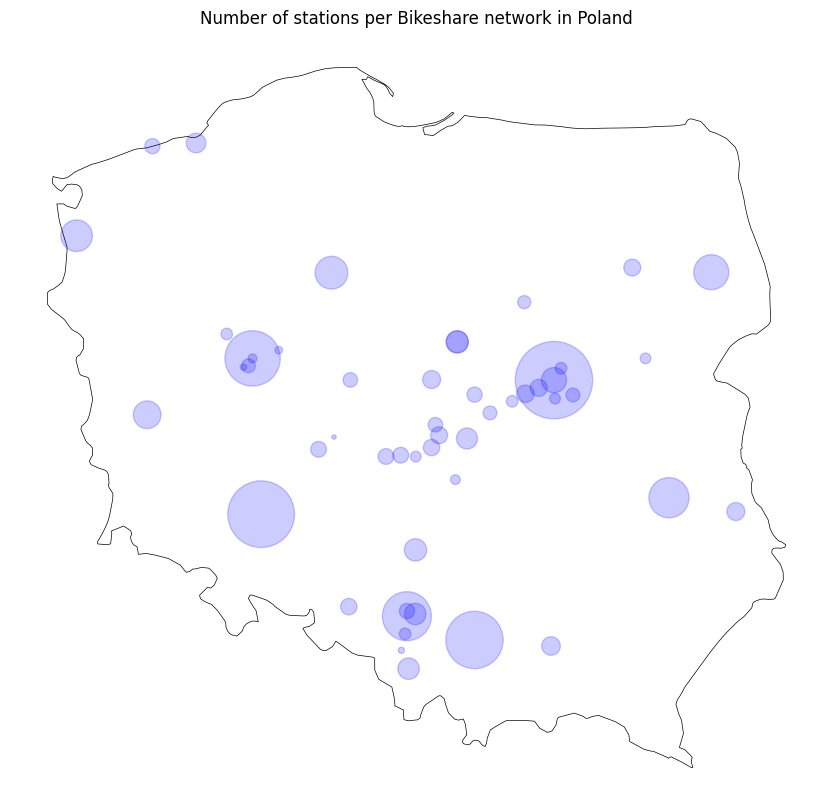

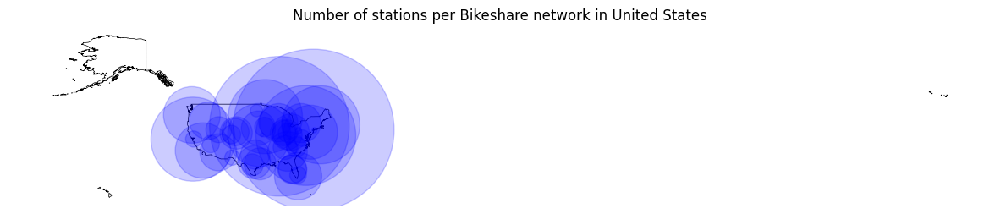

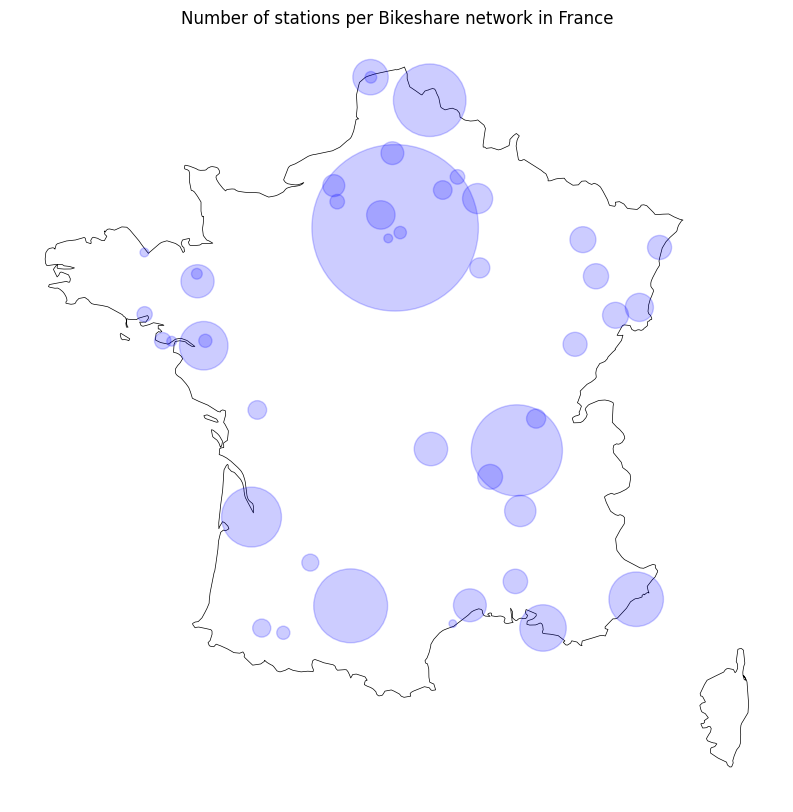

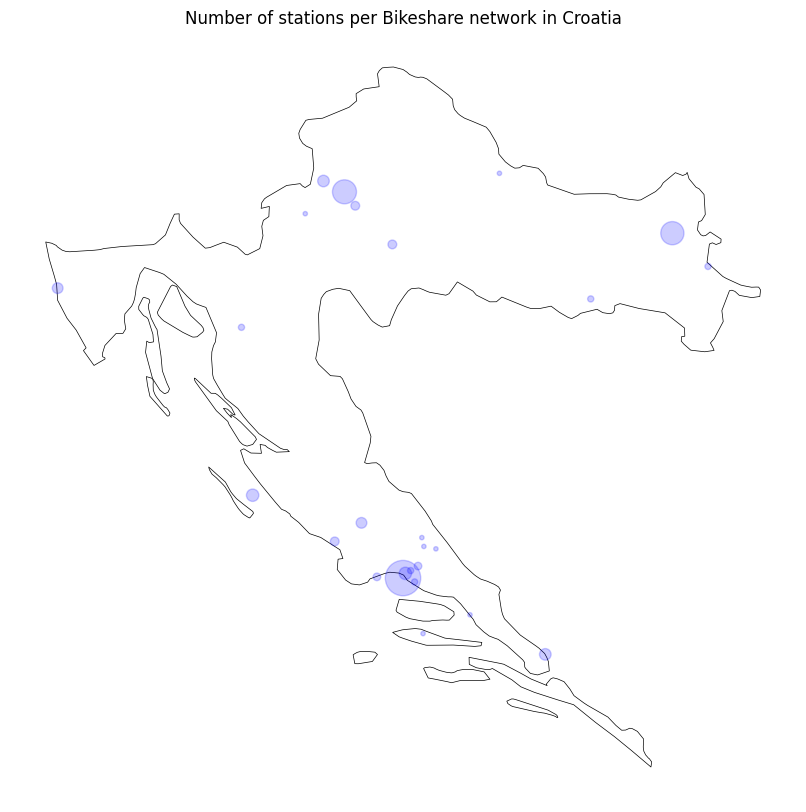

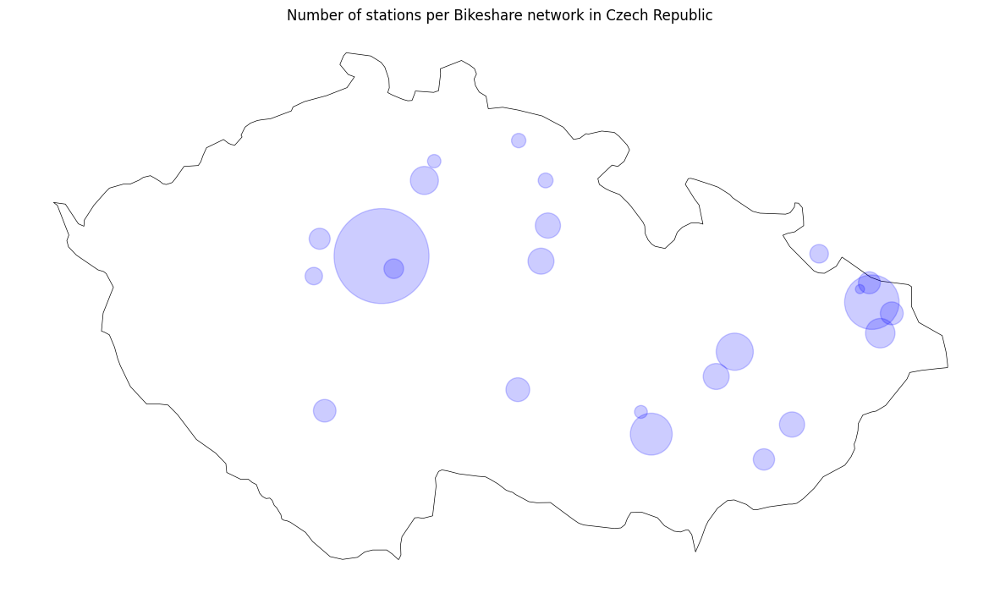

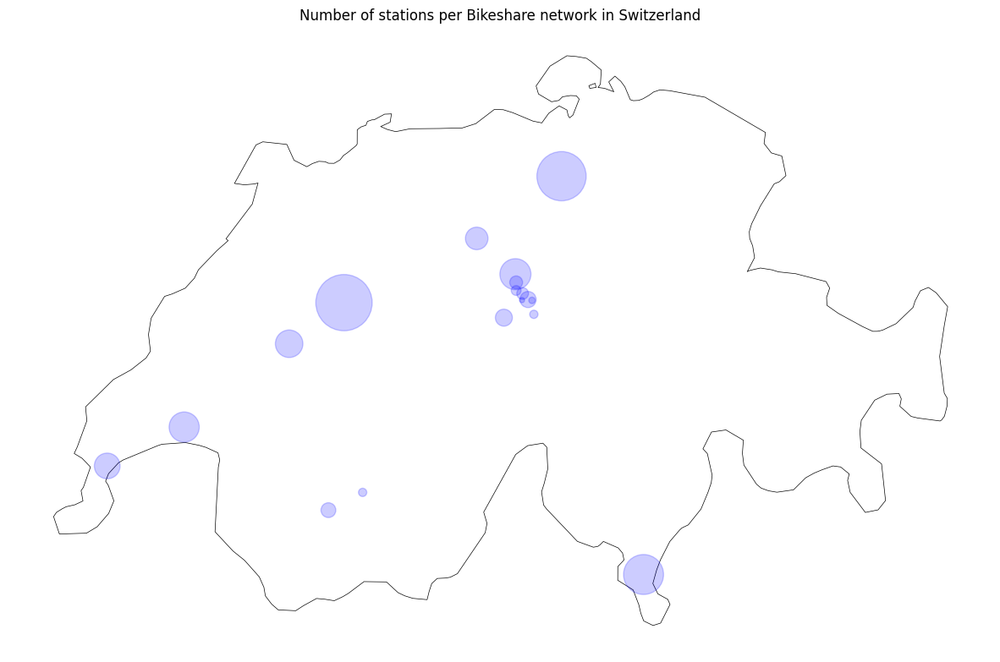

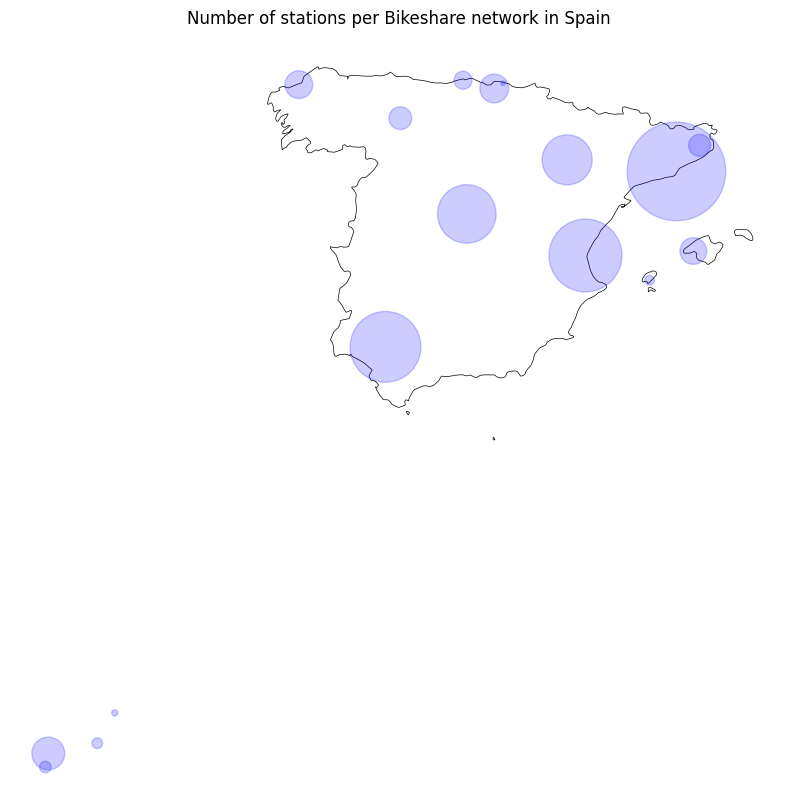

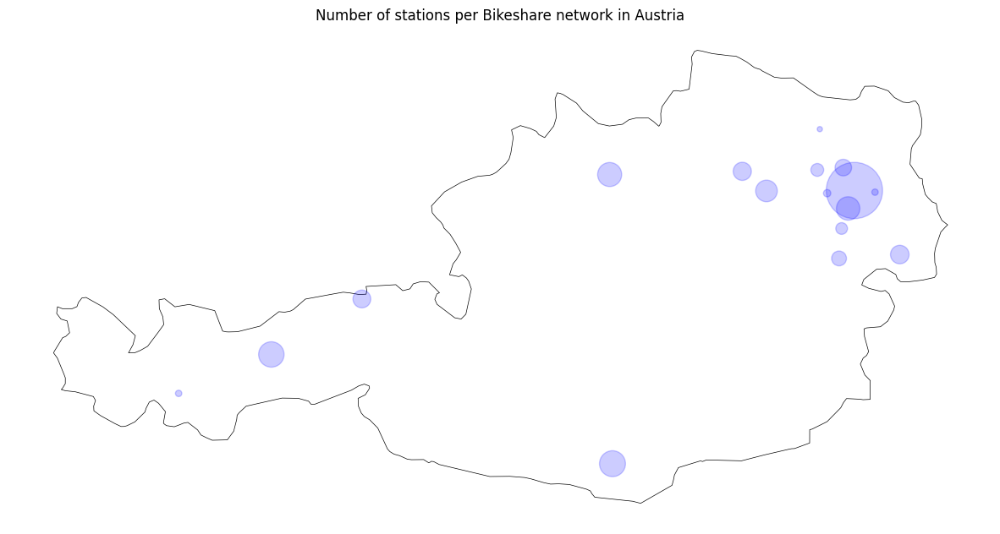

In [120]:
top_10 = countries_gdf.sort_values(by='networks', ascending=False)[:10]

for i in range(0,len(top_10)):
    country_name = top_10.COUNTRY.iloc[i]
    plots_country(country_name)